In [15]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import healpy as hp
import os, h5py
import tensorflow as tf

from msfm.utils.input_output import read_yaml

In [16]:
conf_dir = "../../configs/config.yaml"
conf = read_yaml(conf_dir)

n_side = conf["analysis"]["n_side"]
n_pix = conf["analysis"]["n_pix"]

In [17]:
pix_file = "../../data/DESY3_pixels_512.h5"
with h5py.File(pix_file, "r") as f:
    data_vec_pix = f["metacal/map_cut_outs/data_vec_ids"][:]
    non_tomo_patches_pix = f["metacal/masks/RING/non_tomo"][:]

In [45]:
data_vector_file = "/Users/arne/data/CosmoGrid_example/DES/grid/cosmo_000001/data_vectors.h5"

map_types = ["kg", "ia", "sn", "ct"]
with h5py.File(data_vector_file, "r") as f:
    print(f.keys())

    # kg_dvs = f["kg"][:]
    # ia_dvs = f["ia"][:]
    # sn_dvs = f["sn"][:]
    # ct_dvs = f["ct"][:]

    all_data_vectors = []
    for map_type in map_types:
        all_data_vectors.append(f[map_type][:])

# shape (len(map_types), n_patches, n_patch_pix, n_tomo)
all_data_vectors = np.stack(all_data_vectors, axis=0)
print(all_data_vectors.shape)

<KeysViewHDF5 ['ct', 'ia', 'kg', 'sn']>
(4, 16, 463872, 4)


In [69]:
hp.UNSEEN

-1.6375e+30

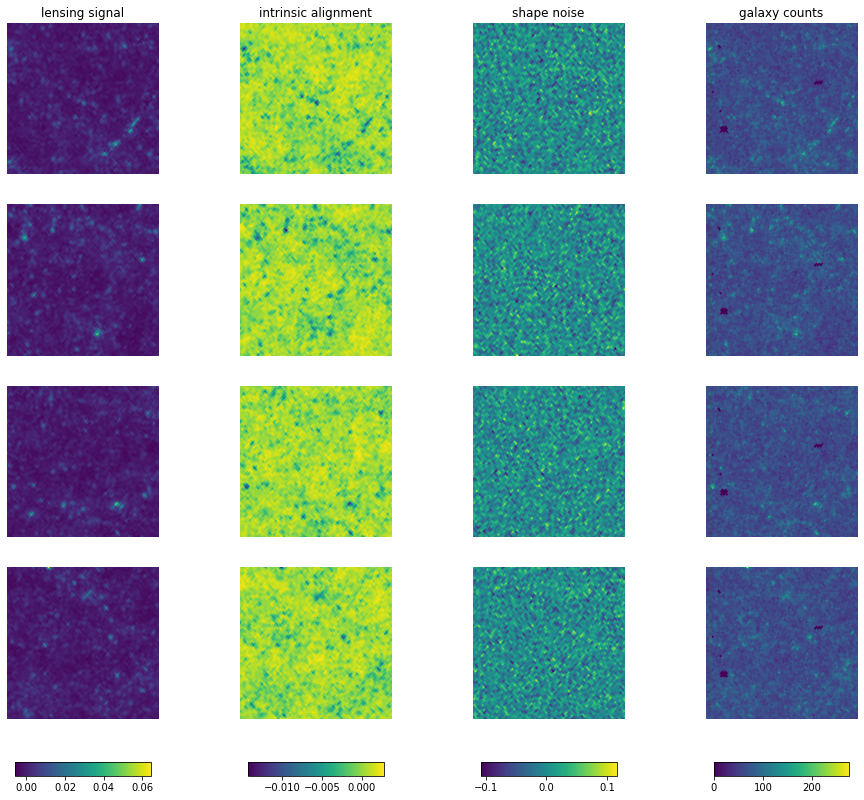

In [74]:
long_map_types = ["lensing signal", "intrinsic alignment", "shape noise", "galaxy counts"]

tomo = 0
patch_ids = np.arange(4)

pix_reso = 500

all_gnoms = np.zeros((len(patch_ids), 4, pix_reso, pix_reso))
for i in patch_ids:
    # shape (len(map_types), n_patch_pix)
    data_vectors = all_data_vectors[:, i, :, tomo]

    # loop over the map types
    gnoms = []
    for j, data_vector in enumerate(data_vectors):
        hp_map = np.zeros(n_pix)
        hp_map[data_vec_pix] = data_vector

        gnom = hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), reso=1, return_projected_map=True, no_plot=True, xsize=pix_reso, ysize=pix_reso)
        gnoms.append(gnom)

        all_gnoms[i,j] = gnom

fig, ax = plt.subplots(figsize=(16, 4*len(patch_ids)), ncols=4, nrows=len(patch_ids), sharex=True, sharey=True)
# over all axis but the map type
vmin = all_gnoms.min(axis=(0, 2, 3))
vmax = all_gnoms.max(axis=(0, 2, 3))

for i in patch_ids:
    for j, map_type in enumerate(map_types):
        gnom = all_gnoms[i,j]

        im = ax[i,j].imshow(gnom, vmin=vmin[j], vmax=vmax[j])
        ax[i,j].axis("off")

        if i==0:
            ax[i,j].set(title=f"{long_map_types[j]}")

        if i==(len(patch_ids)-1):
            fig.colorbar(im, ax=ax[:,j], orientation="horizontal", shrink=0.7, aspect=10, pad=0.05)



    


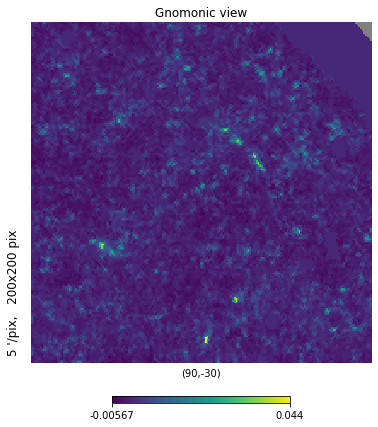

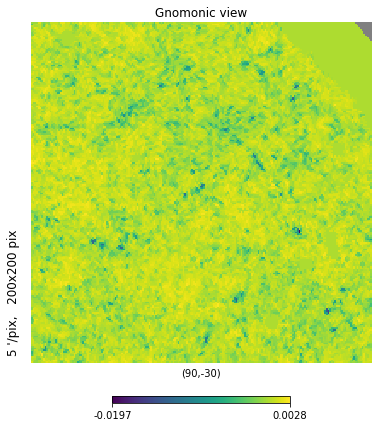

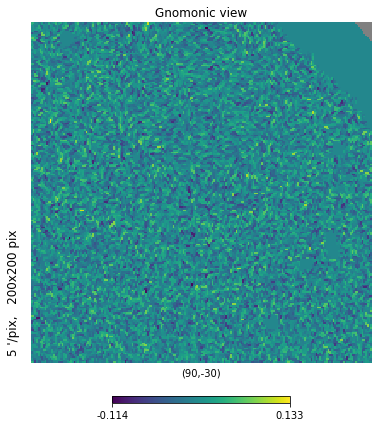

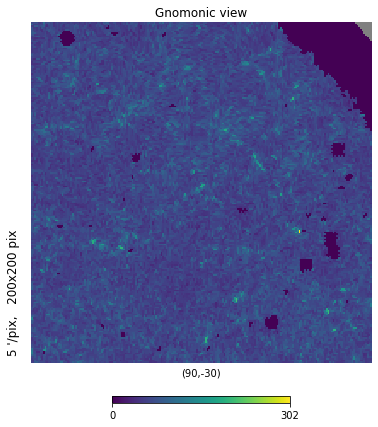

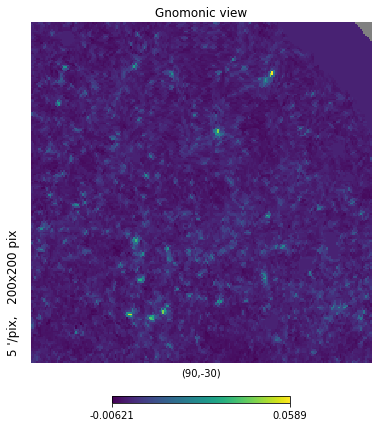

...

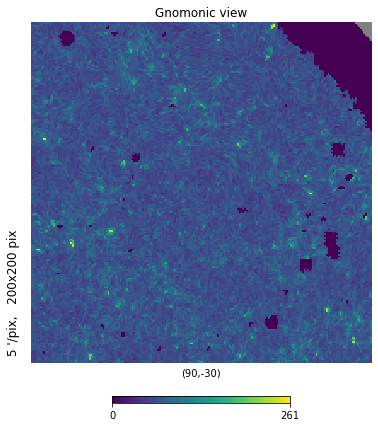

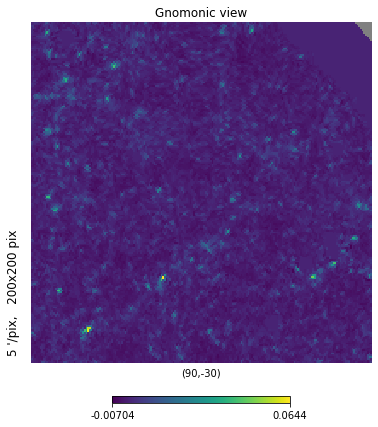

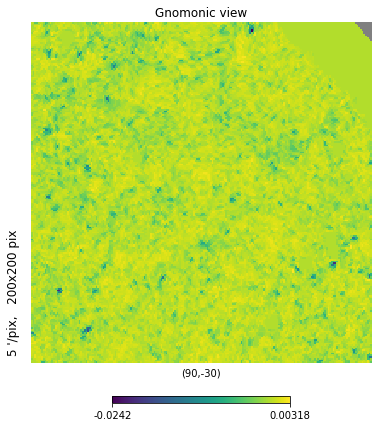

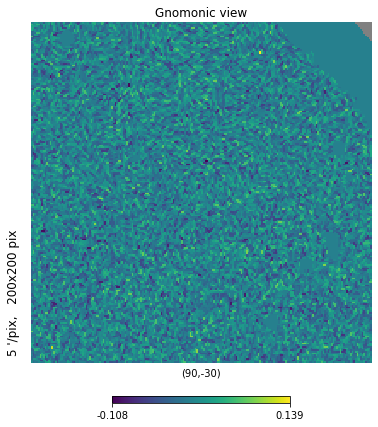

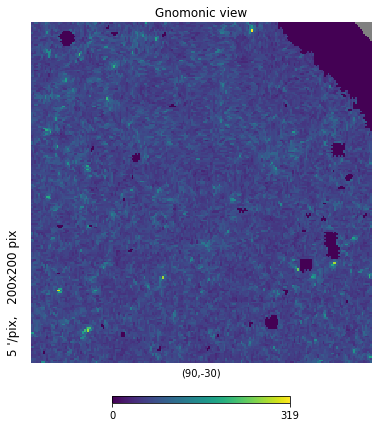

In [75]:
long_map_types = ["lensing signal", "intrinsic alignment", "shape noise", "galaxy counts"]

tomo = 0
patch_ids = np.arange(4)

pix_reso = 500

all_gnoms = np.zeros((len(patch_ids), 4, pix_reso, pix_reso))
for i in patch_ids:
    # shape (len(map_types), n_patch_pix)
    data_vectors = all_data_vectors[:, i, :, tomo]

    # loop over the map types
    for j, data_vector in enumerate(data_vectors):
        hp_map = np.full(n_pix, hp.UNSEEN)
        hp_map[data_vec_pix] = data_vector

        hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), reso=5)

In [56]:
all_gnoms.shape

(2, 4, 200, 200)

In [58]:
all_gnoms.min(axis=(0, 2, 3))

array([-0.00621355, -0.01967335, -0.11430333,  0.        ])

(4, 463872)
(4, 463872)


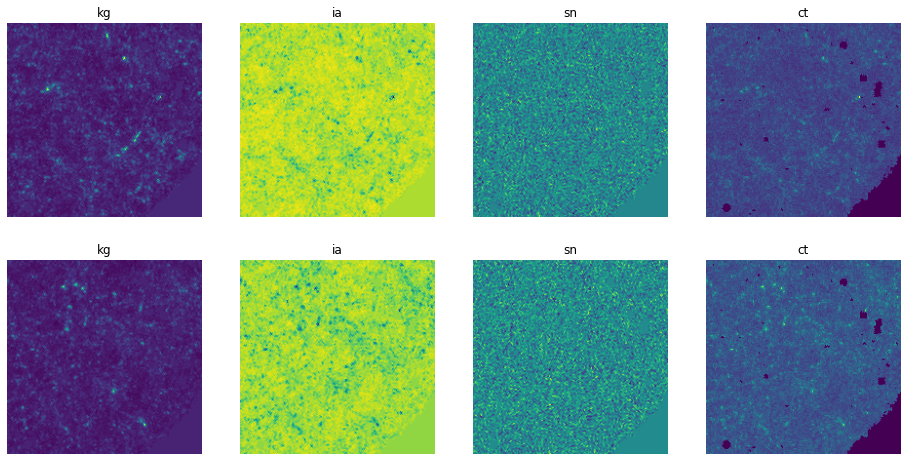

In [54]:
tomo = 0
patch_ids = [0, 1]

fig, ax = plt.subplots(figsize=(16, 4*len(patch_ids)), ncols=4, nrows=len(patch_ids), sharex=True, sharey=True)

for i in patch_ids:
    # shape (len(map_types), n_patch_pix)
    data_vectors = all_data_vectors[:, i, :, tomo]
    print(data_vectors.shape)

    # loop over the map types
    gnoms = []
    for j, data_vector in enumerate(data_vectors):
        hp_map = np.zeros(n_pix)
        hp_map[data_vec_pix] = data_vector

        gnom = hp.gnomview(hp_map, nest=True, rot=(90, -30, 0), reso=5, return_projected_map=True, no_plot=True)
        gnoms.append(gnom)

        ax[i,j].imshow(gnom)
        ax[i,j].set(title=f"{map_types[j]}")
        ax[i,j].axis("off")


    


In [ ]:
tomo = 0
patch_ids = [0, 1, 2, 3]

fig, ax = plt.subplots(figsize=(4*len(patches), 16), ncols=4, nrows=len(patches))

for patch_id in patch_ids:
    kg_dv = kg_dvs[patch_id, :, tomo]
    ia_dv = ia_dvs[patch_id, :, tomo]
    sn_dv = sn_dvs[patch_id, :, tomo]
    ct_dv = ct_dvs[patch_id, :, tomo]

    kg_map = np.zeros(n_pix)
    kg_map[data_vec_pix] = kg_dv

    kg_map = np.zeros(n_pix)
    kg_map[data_vec_pix] = kg_dv

    kg_map = np.zeros(n_pix)
    kg_map[data_vec_pix] = kg_dv

    kg_map = np.zeros(n_pix)
    kg_map[data_vec_pix] = kg_dv

    kg_gnom = hp.gnomview(kg_map, nest=True, min=vmin, max=vmax, rot=(90, -30, 0), reso=5, return_projected_map=True, no_plot=True)
    # ax[patch_id, 0].

In [32]:
kg_dvs.shape

(16, 463872, 4)

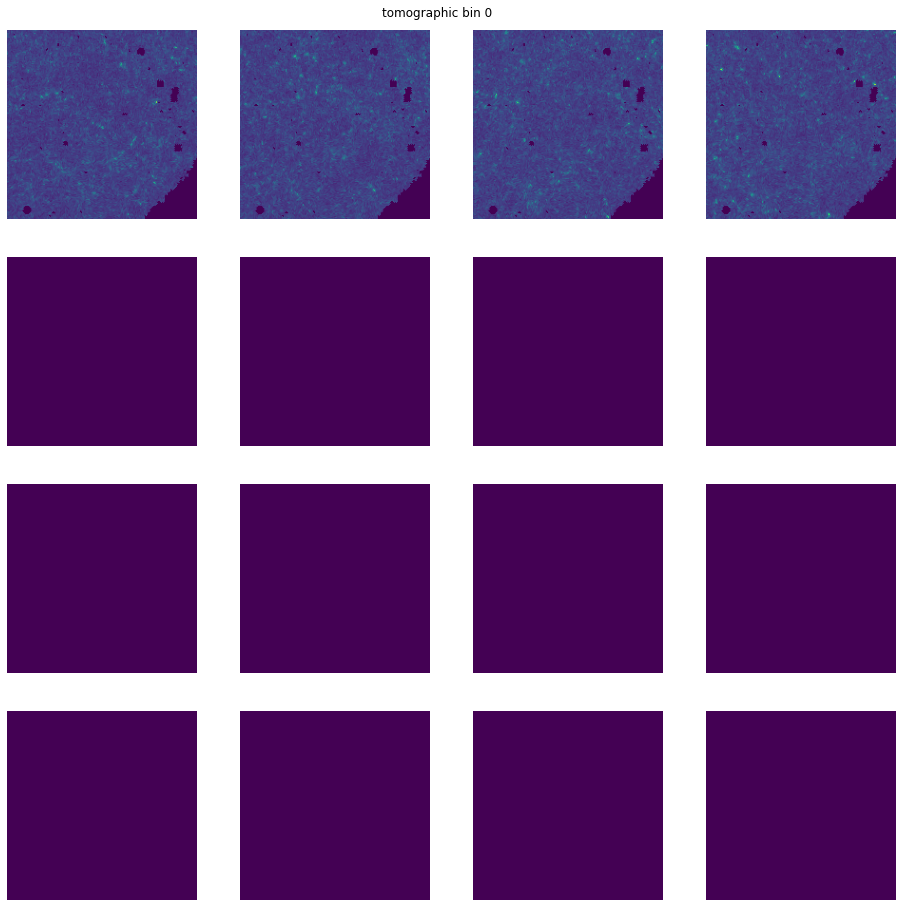

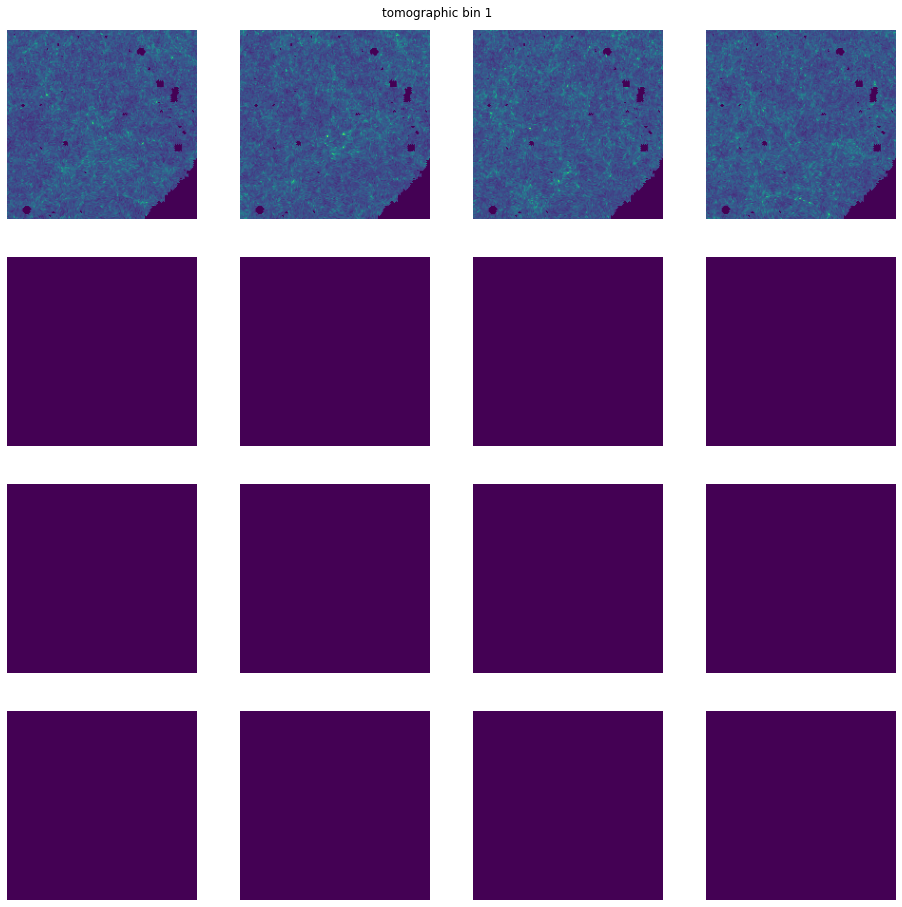

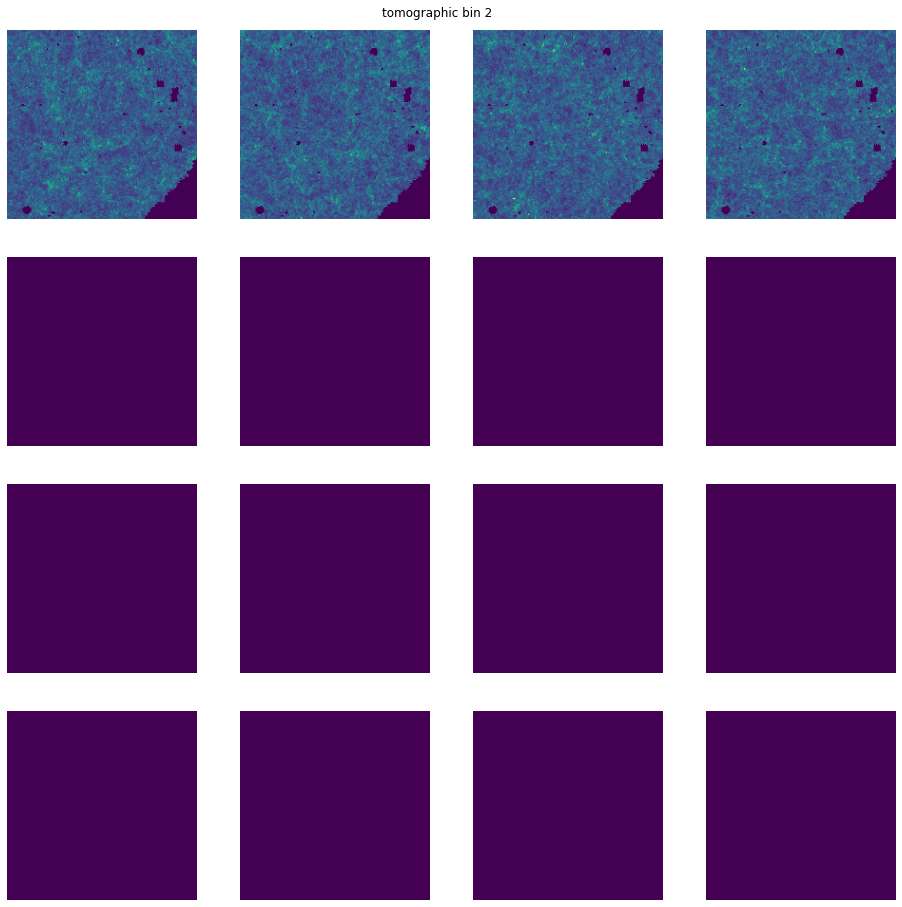

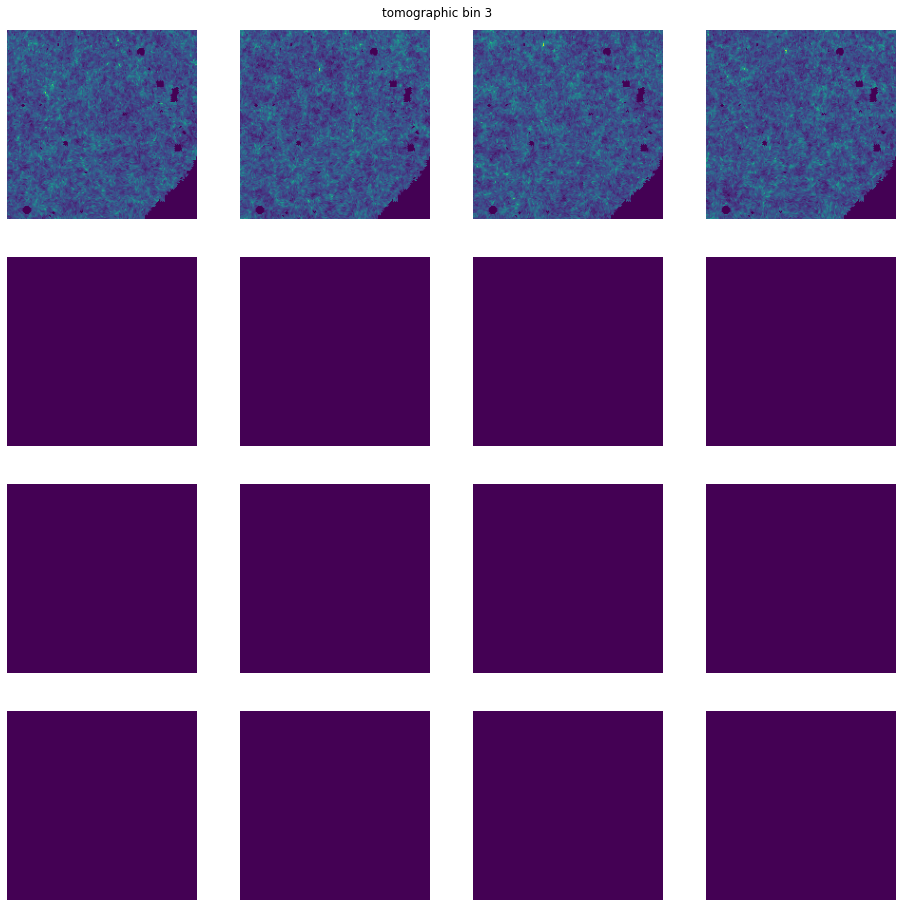

In [29]:
vmin = kg_dvs.min()
vmax = kg_dvs.max()

for tomo in range(4):
    kg_dv_non_tomo = kg_dvs[:,:,tomo]
    
    vmin = kg_dv_non_tomo.min()
    vmax = kg_dv_non_tomo.max()

    gnoms = []
    for i, kg_dv in enumerate(kg_dv_non_tomo):
        kg_map = np.full(n_pix, hp.UNSEEN)
        kg_map[data_vec_pix] = kg_dv

        patch = i % 4
        perm = i // 4
        # hp.mollview(kg_map, nest=True, title=f"tomographic bin {tomo}, patch {patch}, permutation {perm}", min=vmin, max=vmax)

        kg_map[kg_map==hp.UNSEEN] = 0
        gnom = hp.gnomview(kg_map, nest=True, min=vmin, max=vmax, rot=(90, -30, 0), reso=5, return_projected_map=True, no_plot=True)
        gnoms.append(gnom)

    gnoms = np.array(gnoms)

    fig, ax = plt.subplots(figsize=(16, 16), ncols=4, nrows=4, sharex=True, sharey=True)
    vmin = np.stack(gnoms).min()
    vmax = np.stack(gnoms).max()
    k = 0
    for i in range(4):
        for j in range(4):
            ax[i,j].imshow(gnoms[k], vmin=vmin, vmax=vmax)
            ax[i,j].axis('off')

            k += 1

    fig.suptitle(f"tomographic bin {tomo}", y=0.9)


In [6]:
patches_file = "/Users/arne/data/CosmoGrid_example/DES/grid/cosmo_000001/data_patches.h5"

with h5py.File(patches_file, "r") as f:
    print(f.keys())
    print(f["kg"])
    kg_patches = f["kg"][:]

<KeysViewHDF5 ['ia', 'kg']>
<HDF5 dataset "kg": shape (16, 369764, 4), type "<f4">


/Users/arne/miniforge3/envs/py39/lib/python3.9/site-packages/healpy/visufunc.py:468: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = pylab.figure(fig, figsize=(5.8, 6.4))


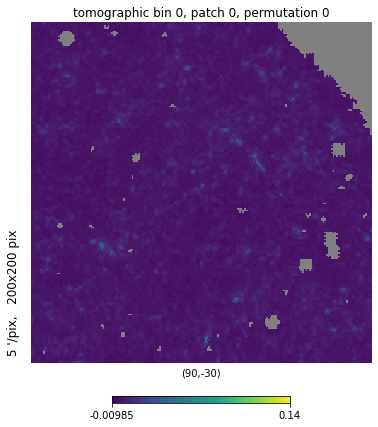

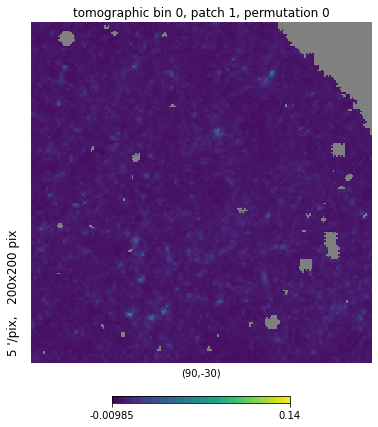

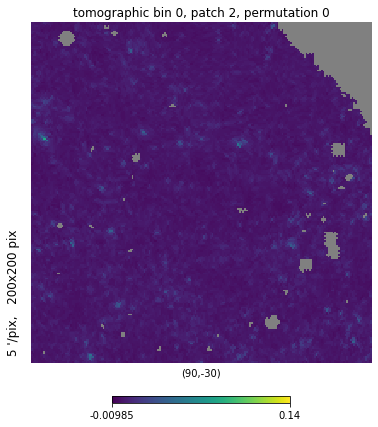

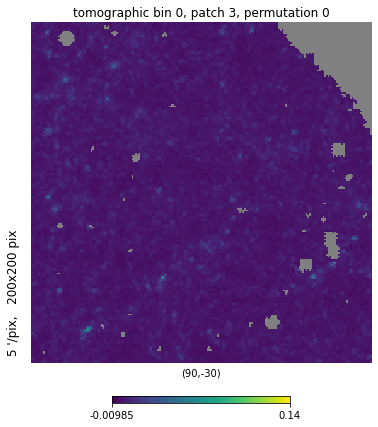

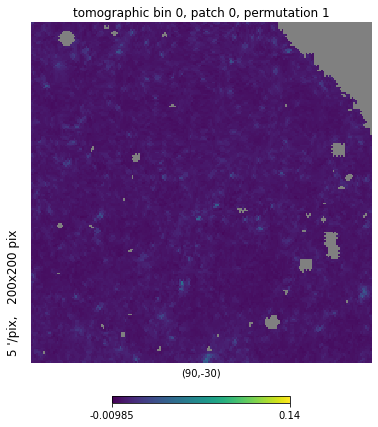

...

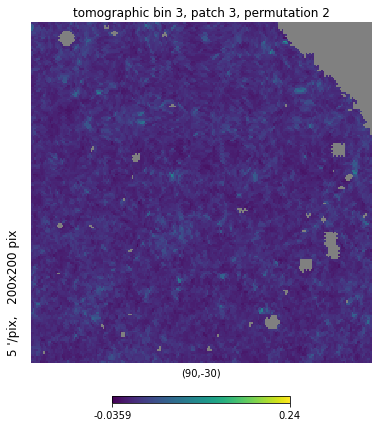

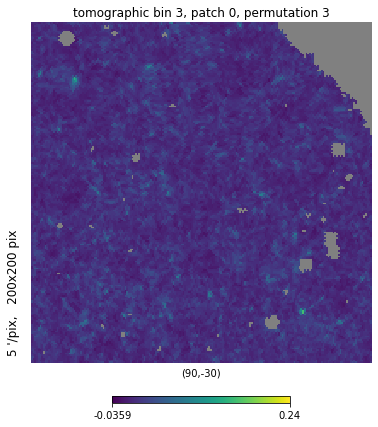

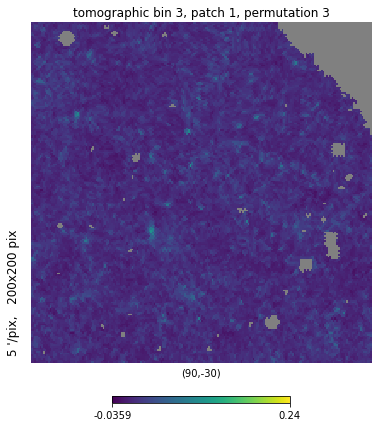

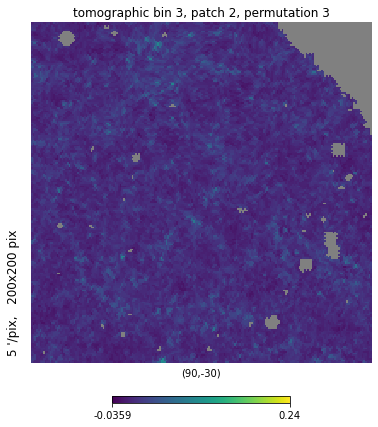

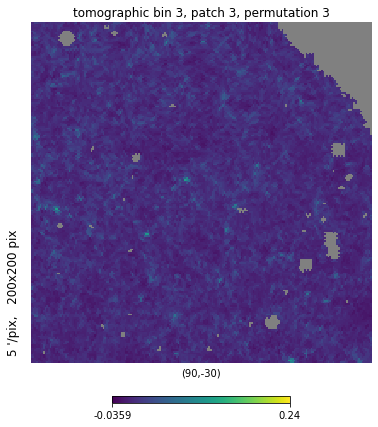

In [7]:
vmin = kg_dvs.min()
vmax = kg_dvs.max()

for tomo in range(4):
    kg_patches_non_tomo = kg_patches[:,:,tomo]
    
    vmin = kg_patches_non_tomo.min()
    vmax = kg_patches_non_tomo.max()

    gnoms = []
    for i, kg_kg_patch in enumerate(kg_patches[:,:,tomo]):
        kg_map = np.full(n_pix, hp.UNSEEN)
        kg_map[non_tomo_patches_pix] = kg_kg_patch

        patch = i % 4
        perm = i // 4
        # hp.mollview(kg_map, title=f"tomographic bin {tomo}, patch {patch}, permutation {perm}", min=vmin, max=vmax)
        gnom = hp.gnomview(kg_map, min=vmin, max=vmax, rot=(90, -30, 0), reso=5, return_projected_map=True, no_plot=False, title=f"tomographic bin {tomo}, patch {patch}, permutation {perm}")
